In [1]:
%cd .. # Run only once to move to the correct directory.

/Users/mpin/Documents/MDS/block_3/DSCI_522/DSCI_522_group27


In [3]:
from src.download_data import download_data
import pandas as pd
import pandas_profiling 
import altair as alt
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [4]:
white_wine_df = download_data('wine-quality','winequality-white.csv')

# Exploratory data analysis of the Wine Quality Data Set (White wine)

# Research question

For this project, we are interested in creating a model to predict subjective wine quality scores, as scored by wine reviewers, based on a set of physicochemical features of the wine.

## Summary of the dataset

The data set used in this project is the wine quality data set created by Dr. P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. It was sourced from the UCI Machine Learning Repository, and which can be found here [here](https://archive.ics.uci.edu/ml/datasets/wine+quality). We will be working with the white wine data set for our analysis. 

Each row in the data set represents physicochemical properties of the wine (such as fixed acidity, residual sugar, density, pH, etc), as well as a quality rating (based on sensory data) given to the wine.

There are 4898 observations in the data set, and 11 features. There are 0 observations with missing values as can be seen in the cell below. 

Below barchart shows the number of observations for each quality rating in the data set.

In [5]:
white_wine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [6]:
white_wine_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [7]:
white_wine_df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6


In [8]:
alt.Chart(white_wine_df).mark_bar(size=55).encode(
    x=alt.X('quality', axis=alt.Axis(values=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])),
    y='count()')

alt.Chart(...)

## Check correlation between features

In [9]:
cor_data = (white_wine_df.corr().stack()
              .reset_index()
              .rename(columns={0: 'correlation', 'level_0': 'variable', 'level_1': 'variable2'}))
cor_data['correlation_label'] = cor_data['correlation'].map('{:.2f}'.format)  # Round to 2 decimal

In [10]:
base = alt.Chart(cor_data).encode(
    x='variable2:O',
    y='variable:O'    
)

# Text layer with correlation labels
# Colors are for easier readability
text = base.mark_text().encode(
    text='correlation_label',
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# The correlation heatmap itself
cor_plot = base.mark_rect().encode(
    alt.Color('correlation:Q', scale=alt.Scale(domain=(-1, 1), scheme='purpleorange'))
)

(cor_plot + text).properties(height=600, width = 600).configure_axis(labelFontSize = 16
).configure_legend(titleFontSize = 15)

alt.LayerChart(...)

From this correlation table, we can observe that the correlation between density and residual is about 0.78, and the correlation between density and alcohol is about -0.82.

This chart shows that the feature which is correlated most strongly with wine quality ratings is "alcohol". Other features including "density", "chlorides" and "volatile acidity" were also found to have a weak negative correlation with quality ratings.

## Distribution of features

In [11]:
numeric_cols = list(white_wine_df.select_dtypes(include=['float64','int64']).drop(columns=['quality']).columns)

alt.Chart(white_wine_df).mark_bar().encode(
    alt.X(alt.repeat("repeat"), type='quantitative', bin=alt.Bin(maxbins=100)),
    alt.Y('count()')
).properties(height=100
).repeat(repeat = numeric_cols, columns=2)

alt.RepeatChart(...)

The above bar charts demonstrate the distributions of each of the features in the dataset. We can see all of our data is continuous and that each feature follows a typical distribution with few outlier’s present. This data lines up with outside sources, with the pH for example falling within [the expected range for most wine of 2.5-4.5](https://winefolly.com/deep-dive/understanding-acidity-in-wine/). These charts show that some features are relatively uniform for most wines (i.e. chlorides, density, relative sugar) while other features have a greater level of variance between different wines (i.e. alcohol, sulphates, total sulfur dioxide).

## Overlap of features

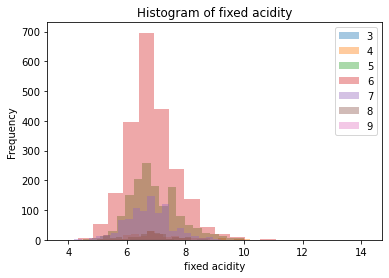

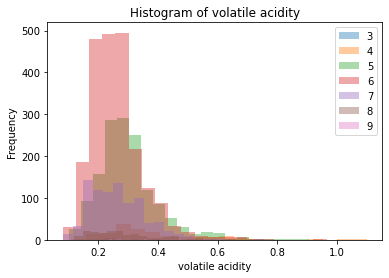

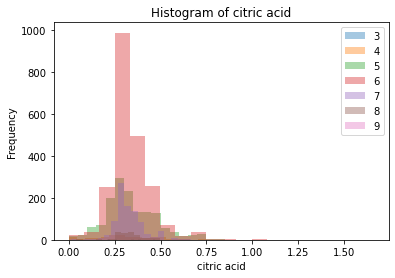

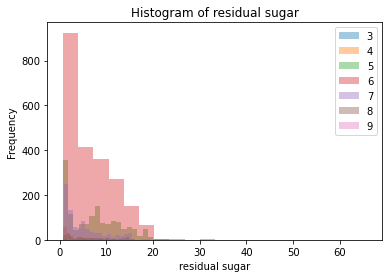

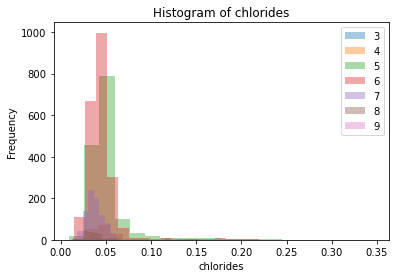

...

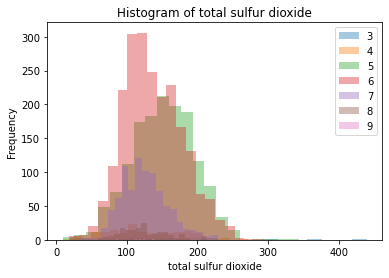

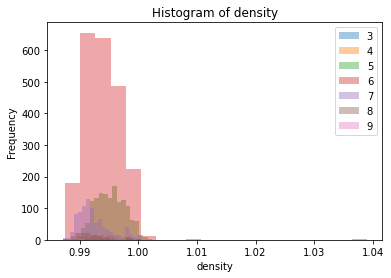

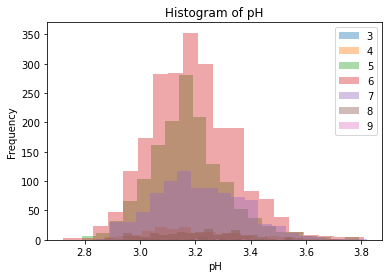

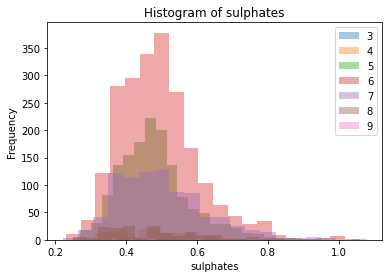

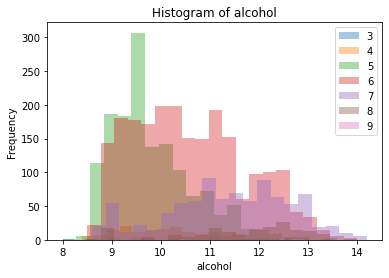

In [36]:
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides',
         'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']

for feat in features:
    ax = white_wine_df.groupby("quality")[feat].plot.hist(bins=20, alpha=0.4, legend=True)
    plt.xlabel(feat)
    plt.title("Histogram of " + feat)
    plt.show()

With the above charts we are able to see that different features are more heavily correlated with certain quality ratings. For example, alcohol appears to be a promising feature since we can see that lower ratings (such as 5 and 6) appear to be further skewed to the left in the chart while higher ratings appear to be more skewed to the right. Features such as fixed acidity can also be seen as a negative feature in these charts, with the lower scoring wines being skewed further to the right than the higher scoring wines.

# Partitioning the data into training and test sets

Next, we partition the data set such that 75% of the data is in the train set and 25% of the data is in the test set.

Below is a visualization of the number of observations for quality in each of the train and test splits.

In [9]:
train_df, test_df = train_test_split(white_wine_df, test_size=0.25, random_state=123)

X_train = train_df.drop(columns=['quality'])
y_train = train_df['quality']

X_test = test_df.drop(columns=['quality'])
y_test = test_df['quality']

In [10]:
y_train_chart = alt.Chart(pd.DataFrame(y_train), title='Train data').mark_bar(size=55).encode(
    x=alt.X('quality', axis=alt.Axis(values=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])),
    y='count()'
)

y_test_chart = alt.Chart(pd.DataFrame(y_test), title='Test data').mark_bar(size=55).encode(
    x=alt.X('quality', axis=alt.Axis(values=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])),
    y='count()'
)

y_train_chart | y_test_chart

alt.HConcatChart(...)

As we would have hoped, the distribution of our data remained unchanged after the split. The weight of our distribution, however, lies around 6. If during initial training, we notice that this is affecting our results, we may need to look into methods to address the low number of observations at the ends of the quality rating scale.

## Apprendix - Pandas Profiling Report

In [24]:
white_wine_df.profile_report(progress_bar = False)

From the report above, we observe that there are no missing values. There are 12 variables, and they are all numerical variables. We have 4898 observations in total in this white wine data set.